In [1]:
import pandas as pd
import numpy as np
from IPython.display import display, HTML
from functools import reduce
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import folium
from folium.plugins import HeatMap
import json

import warnings
warnings.simplefilter("ignore")

pd.set_option('display.width', 150)

opr = r'C:\Users\chris\Desktop\ML\Case\Open_Restaurants_Inspections_20250320.csv'
dohmh = r'C:\Users\chris\Desktop\ML\Case\DOHMH_New_York_City_Restaurant_Inspection_Results_20250320.csv'
zcta = r'C:\Users\chris\Desktop\ML\Case\tl_2020_us_zcta520.shp'
popl = r'C:\Users\chris\Desktop\ML\Case\DECENNIALDHC2020.P1-Data.csv'
demo = r'C:\Users\chris\Desktop\ML\Case\ACSDP5Y2023.DP05-Data.csv'
income = r'C:\Users\chris\Desktop\ML\Case\ACSST5Y2023.S2503-Data.csv'
traffic = r'C:\Users\chris\Desktop\ML\Case\Automated_Traffic_Volume_Counts_20250321.csv'

def describe_data(path, source = None):
    if source == "Census":
        df = pd.read_csv(path, header = 1)
    else:
        df = pd.read_csv(path)

    # display(HTML(df.head(5).to_html()))
    print("Example Data:")
    print(df.head(5))
   
    # 1. Overall DataFrame info
    print("\nDataFrame Info:")
    df.info()
   
    # 2. Basic statistics for numeric columns
    print("\nBasic Statistics:")
    print(df.describe())
   
    # 3. Check for missing values
    print("\nMissing Values:")
    print(df.isnull().sum())
    print("\nMissing Values Percentage:")
    print((df.isnull().sum() / len(df)) * 100)
   
    # 4. Check for duplicates
    print("\nDuplicate Rows:", df.duplicated().sum())

    #5. Print column names
    print("\nColumn Names:")
    print(df.columns)

    return df

In [2]:
opr_df = describe_data(opr)

Example Data:
     Borough             RestaurantName SeatingChoice                 LegalBusinessName     BusinessAddress  RestaurantInspectionID  \
0  Manhattan                Oscar Wilde          both                Camelot Castle LLC    45  West 27th st                   72891   
1  Manhattan        LA RUBIA RESTAURANT          both           LA RUBIA RESTAURANT INC       3517 BROADWAY                   72892   
2  Manhattan               Thai Sliders      sidewalk                    Silom Thai Inc       150   8th Ave                   72893   
3   Brooklyn                      Otway          both                  St james 930 LLC   930 Fulton street                   72894   
4   Brooklyn  WILLIAMSBURG THAI CUISINE          both  WILLIAMSBURG THAI CUISINE NY INC  212 BEDFORD AVENUE                   72896   

   IsSidewayCompliant IsRoadwayCompliant SkippedReason             InspectedOn AgencyCode  Postcode   Latitude  Longitude  CommunityBoard  \
0                 NaN      Non-Com

In [3]:
dohmh_df = describe_data(dohmh)

Example Data:
      CAMIS                         DBA       BORO BUILDING              STREET  ZIPCODE       PHONE CUISINE DESCRIPTION INSPECTION DATE ACTION  \
0  50149662            THREE LEGGED CAT   Brooklyn      142    WATERBURY STREET  11206.0  9292152692                 NaN      01/01/1900    NaN   
1  50148027                     Sho Tse  Manhattan      120  CHRISTOPHER STREET  10014.0  6099681327                 NaN      01/01/1900    NaN   
2  50164327            HZJ KITCHEN INC.     Queens    15630       NORTHERN BLVD  11354.0  3476588828                 NaN      01/01/1900    NaN   
3  50161810                 CHICK-FIL-A   Brooklyn      809     ATLANTIC AVENUE  11238.0  9178100455                 NaN      01/01/1900    NaN   
4  50141224  HABIBI  BAR AND RESTAURANT   Brooklyn      154        SCOTT AVENUE  11237.0  9738656298                 NaN      01/01/1900    NaN   

   ... INSPECTION TYPE   Latitude  Longitude  Community Board Council District Census Tract        BIN 

In [4]:
popl_df = describe_data(popl, "Census")

Example Data:
        Geography Geographic Area Name   !!Total  Unnamed: 3
0  860Z200US00601          ZCTA5 00601     17242         NaN
1  860Z200US00602          ZCTA5 00602     37548         NaN
2  860Z200US00603          ZCTA5 00603     49804         NaN
3  860Z200US00606          ZCTA5 00606      5009         NaN
4  860Z200US00610          ZCTA5 00610     25731         NaN

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33774 entries, 0 to 33773
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Geography             33774 non-null  object 
 1   Geographic Area Name  33774 non-null  object 
 2    !!Total              33774 non-null  int64  
 3   Unnamed: 3            0 non-null      float64
dtypes: float64(1), int64(1), object(2)
memory usage: 1.0+ MB

Basic Statistics:
             !!Total  Unnamed: 3
count   33774.000000         0.0
mean     9910.777107         NaN
std     1

In [5]:
demo_df = describe_data(demo, "Census")

Example Data:
        Geography Geographic Area Name  Estimate!!SEX AND AGE!!Total population Margin of Error!!SEX AND AGE!!Total population  \
0  860Z200US00601          ZCTA5 00601                                    16721                                            477   
1  860Z200US00602          ZCTA5 00602                                    37510                                            263   
2  860Z200US00603          ZCTA5 00603                                    48317                                           1021   
3  860Z200US00606          ZCTA5 00606                                     5435                                            331   
4  860Z200US00610          ZCTA5 00610                                    25413                                            368   

   Estimate!!SEX AND AGE!!Total population!!Male Margin of Error!!SEX AND AGE!!Total population!!Male  \
0                                           8156                                                238 

In [6]:
income_df = describe_data(income, "Census")

Example Data:
        Geography Geographic Area Name  Estimate!!Occupied housing units!!Occupied housing units  \
0  860Z200US00601          ZCTA5 00601                                               5611          
1  860Z200US00602          ZCTA5 00602                                              12546          
2  860Z200US00603          ZCTA5 00603                                              19537          
3  860Z200US00606          ZCTA5 00606                                               1871          
4  860Z200US00610          ZCTA5 00610                                               8838          

   Margin of Error!!Occupied housing units!!Occupied housing units  \
0                                                258                 
1                                                510                 
2                                                671                 
3                                                192                 
4                                  

In [7]:
traf_df = describe_data(traffic)

Example Data:
   RequestID      Boro    Yr   M   D  HH  MM  Vol  SegmentID                                       WktGeom          street                   fromSt  \
0      32970    Queens  2021   4  30   2   0    0     149701  POINT (997407.0998491726 208620.92612708386)  PULASKI BRIDGE  Newtown Creek Shoreline   
1      32970    Queens  2021   4  30   2  15    1     149701  POINT (997407.0998491726 208620.92612708386)  PULASKI BRIDGE  Newtown Creek Shoreline   
2      11342  Brooklyn  2012  12  18   8  15   33      20063                     POINT (985746.5 167127.4)           61 ST                    15 AV   
3      32970    Queens  2021   4  30   2  30    0     149701  POINT (997407.0998491726 208620.92612708386)  PULASKI BRIDGE  Newtown Creek Shoreline   
4      32970    Queens  2021   4  30   2  45    0     149701  POINT (997407.0998491726 208620.92612708386)  PULASKI BRIDGE  Newtown Creek Shoreline   

       toSt Direction  
0  Dead end        NB  
1  Dead end        NB  
2     1

In [8]:
opr_df['InspectedOn'] = pd.to_datetime(opr_df['InspectedOn'])

opr_df = opr_df.loc[opr_df.groupby('RestaurantName')['InspectedOn'].idxmax()].reset_index(drop = True)

dohmh_df['INSPECTION DATE'] = pd.to_datetime(dohmh_df['INSPECTION DATE'])

dohmh_df = dohmh_df.loc[dohmh_df.groupby('CAMIS')['INSPECTION DATE'].idxmax()].reset_index(drop = True)

dohmh_df['Status'] = np.where(dohmh_df['INSPECTION DATE'].dt.year == 1900, 'New', 'Existing')

print(len(opr_df), len(dohmh_df), len(opr_df) + len(dohmh_df))

9890 29875 39765


In [9]:
opr_df['key'] = (
        opr_df['RestaurantName'].str.lower().str.strip() + 
        opr_df['Postcode'].apply(lambda x: 0 if pd.isna(x) else int(x)).astype('str') + 
        opr_df['BIN'].apply(lambda x: 0 if pd.isna(x) else int(x)).astype('str')
        )

dohmh_df['key'] = (
                dohmh_df['DBA'].str.lower().str.strip() + 
                dohmh_df['ZIPCODE'].apply(lambda x: 0 if pd.isna(x) else int(x)).astype('str') + 
                dohmh_df['BIN'].apply(lambda x: 0 if pd.isna(x) else int(x)).astype('str')
                )

print(opr_df, dohmh_df)

            Borough              RestaurantName SeatingChoice            LegalBusinessName             BusinessAddress  RestaurantInspectionID  \
0         Manhattan                      &pizza      sidewalk                    IMA Pizza                740 Broadway                   69555   
1         Manhattan  +aea+?o Ecuadorian Kitchen          both           Nano Endeavour LLC            691 Tenth Avenue                   76951   
2         Manhattan                       1 2 3          both    Peaceful Enterprise Corp.            738  10th Avenue                  111374   
3            Queens            1 Buen Sabor Inc          both             1 Buen Sabor Inc           45-07 Queens Blvd                   47502   
4            Queens                 1 DEGREE UP          both           ASTORIA LOUNGE LLC            3007 NEWTOWN AVE                   79544   
...             ...                         ...           ...                          ...                         ...      

In [10]:
merged_df = pd.merge(opr_df.rename(columns={'Postcode': 'ZIPCODE'})[['Borough','RestaurantName','ZIPCODE','key']],
                     dohmh_df.rename(columns={'DBA': 'RestaurantName','BORO': 'Borough'})[['CAMIS','RestaurantName','Borough','ZIPCODE','SCORE','Status','key']], 
                     on = ['key'], how = 'outer').drop(columns=['key'])

merged_df['Status'] = np.where(
                    merged_df['Borough_x'].notna() & merged_df['Borough_y'].notna(),
                    merged_df['Status'] + ' & Open Space',
                    np.where(
                        merged_df['CAMIS'].isna(),  
                        'Open Space',
                        merged_df['Status']
                    )
                )

merged_df['Borough'] = merged_df['Borough_x'].fillna(merged_df['Borough_y'])
merged_df['RestaurantName'] = merged_df['RestaurantName_x'].fillna(merged_df['RestaurantName_y'])
merged_df['ZIPCODE'] = merged_df['ZIPCODE_x'].fillna(merged_df['ZIPCODE_y'])

merged_df.drop(columns=['Borough_x', 'Borough_y', 'RestaurantName_x', 'RestaurantName_y', 'ZIPCODE_x', 'ZIPCODE_y'], inplace=True)

print(len(merged_df),merged_df)

36256             CAMIS  SCORE      Status        Borough                RestaurantName  ZIPCODE
0      50126747.0   18.0    Existing      Manhattan     "U" LIKE CHINESE TAKE OUT  10034.0
1      50018480.0   12.0    Existing      Manhattan                      "W" CAFE  10018.0
2      50075009.0   13.0    Existing       Brooklyn  #1 GARDEN CHINESE RESTAURANT  11215.0
3      41336841.0   10.0    Existing          Bronx    #1 SABOR LATINO RESTAURANT  10466.0
4      50086385.0    9.0    Existing      Manhattan                      $1 PIZZA  10001.0
...           ...    ...         ...            ...                           ...      ...
36251  50001062.0   33.0    Existing      Manhattan                   ZZ CLAM BAR  10012.0
36252  50162621.0    NaN         New       Brooklyn          ZZ Wine and Beer LLC  11216.0
36253         NaN    NaN  Open Space      Manhattan                 ZZ's Clam Bar  10012.0
36254  41702705.0   27.0    Existing  Staten Island            ZZ'S PIZZA & GRILL  1

In [11]:
print(merged_df['Borough'].value_counts())
print(merged_df['ZIPCODE'].isna().sum())
print(len(merged_df))
print(f"Percentage of entries without ZIPCODE: {merged_df['ZIPCODE'].isna().sum() / len(merged_df) * 100:.2f}%")

Borough
Manhattan        14741
Brooklyn          9161
Queens            8176
Bronx             2988
Staten Island     1175
0                   15
Name: count, dtype: int64
425
36256
Percentage of entries without ZIPCODE: 1.17%


In [12]:
merged_df = merged_df[~((merged_df['ZIPCODE'].isna()) | (merged_df['Borough'] == "0"))]

print(len(merged_df))

35822


In [13]:
score_avg = merged_df[(merged_df['CAMIS'].notnull())
                    & (merged_df['SCORE'].notnull())
                    & (merged_df['Status'] == 'Existing')
                    ].groupby('ZIPCODE')['SCORE'].mean().rename('AVG_SCORE')

merged_df['SCORE'] = merged_df.apply(lambda row: score_avg[row['ZIPCODE']] 
                                     if pd.isna(row['SCORE']) and row['ZIPCODE'] in score_avg 
                                     else row['SCORE'], axis=1)

print(merged_df['SCORE'].isna().sum())

39


In [14]:
merged_df = merged_df[~merged_df['SCORE'].isna()]

merged_df['RestaurantName'] = merged_df['RestaurantName'].str.upper()

merged_df = merged_df.drop_duplicates()

merged_df['CAMIS'] = merged_df['CAMIS'].fillna(0)

print(len(merged_df))

35564


In [15]:
merged_df = merged_df.merge(score_avg, on = 'ZIPCODE', how = 'left')
merged_df['At_Risk'] = np.where(merged_df['SCORE']>merged_df['AVG_SCORE'],'Yes','No')
print(merged_df)

# merged_df.to_csv('test.csv', index = False)


            CAMIS      SCORE      Status        Borough                RestaurantName  ZIPCODE  AVG_SCORE At_Risk
0      50126747.0  18.000000    Existing      Manhattan     "U" LIKE CHINESE TAKE OUT  10034.0  15.571429     Yes
1      50018480.0  12.000000    Existing      Manhattan                      "W" CAFE  10018.0  12.870317      No
2      50075009.0  13.000000    Existing       Brooklyn  #1 GARDEN CHINESE RESTAURANT  11215.0  12.266917     Yes
3      41336841.0  10.000000    Existing          Bronx    #1 SABOR LATINO RESTAURANT  10466.0  12.891566      No
4      50086385.0   9.000000    Existing      Manhattan                      $1 PIZZA  10001.0  12.017510      No
...           ...        ...         ...            ...                           ...      ...        ...     ...
35559  50001062.0  33.000000    Existing      Manhattan                   ZZ CLAM BAR  10012.0  12.555957     Yes
35560  50162621.0  13.099379         New       Brooklyn          ZZ WINE AND BEER LLC  1

In [16]:
nyc = merged_df.groupby(['ZIPCODE']).agg(
    Restaurant_Count = ('CAMIS', 'count'), 
    Inspection_Score = ('SCORE', 'mean'), 
    New_Restaurant_Count = ('Status', lambda x: sum(x.str.contains('New'))),
    Existing_Restaurant_Count = ('Status', lambda x: sum(x.str.contains('Existing'))),
    Open_Space_Restaurant_Count = ('Status', lambda x: sum(x.str.contains('Open'))),
    At_Risk_Restaurant_Count = ('At_Risk', lambda x: sum(x == 'Yes'))
).reset_index()

nyc['ZIPCODE'] = nyc['ZIPCODE'].astype(int)

print(nyc)

     ZIPCODE  Restaurant_Count  Inspection_Score  New_Restaurant_Count  Existing_Restaurant_Count  Open_Space_Restaurant_Count  \
0      10000                 2         13.500000                     0                          2                            0   
1      10001               823         12.213095                   129                        588                          167   
2      10002               755         13.990225                   103                        493                          270   
3      10003               987         13.398178                   100                        656                          396   
4      10004               182         13.389163                    34                        129                           26   
..       ...               ...               ...                   ...                        ...                          ...   
214    11691                48         10.923769                     2                    

In [17]:
# popl_df = pd.read_csv(popl, header = 1)
# popl_df['ZIPCODE'] = popl_df['Geographic Area Name'].str.split().str[-1].astype(int)
# popl_df = popl_df.rename(columns = {' !!Total':'Population'})[['ZIPCODE','Population']]
# print(popl_df)

In [18]:
demo_df = pd.read_csv(demo, header = 1)
demo_df['ZIPCODE'] = demo_df['Geographic Area Name'].str.split().str[-1].astype(int)
demo_df = demo_df.rename(columns = {
'Estimate!!SEX AND AGE!!Total population':'Population',
'Estimate!!SEX AND AGE!!Total population!!Male':'Male',
'Estimate!!SEX AND AGE!!Total population!!Female':'Famale',
'Estimate!!SEX AND AGE!!Total population!!Median age (years)':'Median_Age',
'Estimate!!SEX AND AGE!!Total population!!Under 18 years':'Under_18',
'Estimate!!SEX AND AGE!!Total population!!65 years and over':'65_and_Over',
'Estimate!!SEX AND AGE!!Total population!!20 to 24 years':'20_24',
'Estimate!!SEX AND AGE!!Total population!!25 to 34 years':'25_34',
'Estimate!!SEX AND AGE!!Total population!!35 to 44 years':'35_44',
'Estimate!!SEX AND AGE!!Total population!!45 to 54 years':'45_54'
})
demo_df = demo_df[['ZIPCODE','Population','Male','Famale','Median_Age','Under_18','65_and_Over','20_24','25_34','35_44','45_54']]
print(demo_df)

       ZIPCODE  Population   Male  Famale Median_Age  Under_18  65_and_Over  20_24  25_34  35_44  45_54
0          601       16721   8156    8565       44.8      3028         3685    954   1970   2051   2130
1          602       37510  18339   19171       46.0      5830         8375   2295   4472   4859   4811
2          603       48317  23332   24985       45.6      7974        11693   3030   5770   5628   6234
3          606        5435   2694    2741       48.7       884         1481    190    482    740    664
4          610       25413  12249   13164       45.2      3993         5714   1681   3350   3051   3511
...        ...         ...    ...     ...        ...       ...          ...    ...    ...    ...    ...
33767    99923          25     17       8       67.5         0           25      0      0      0      0
33768    99925         854    471     383       47.1       161          191     27     85    106    160
33769    99926        1385    770     615       37.8       359  

In [19]:
income_df = pd.read_csv(income, header = 1)
income_df['ZIPCODE'] = income_df['Geographic Area Name'].str.split().str[-1].astype(int)
income_df = income_df.rename(columns = {
'Estimate!!Occupied housing units!!Occupied housing units':'Housing_Units',
'Estimate!!Occupied housing units!!Occupied housing units!!HOUSEHOLD INCOME IN THE PAST 12 MONTHS (IN 2023 INFLATION-ADJUSTED DOLLARS)!!Median household income (dollars)':'Median_Household_Income',
'Estimate!!Occupied housing units!!Occupied housing units!!MONTHLY HOUSING COSTS!!Median (dollars)':'Median_Housing_Costs',
'Estimate!!Owner-occupied housing units!!Occupied housing units':'Owner_Housing_Units',
'Estimate!!Owner-occupied housing units!!Occupied housing units!!HOUSEHOLD INCOME IN THE PAST 12 MONTHS (IN 2023 INFLATION-ADJUSTED DOLLARS)!!Median household income (dollars)':'Owner_Median_Household_Income',
'Estimate!!Owner-occupied housing units!!Occupied housing units!!MONTHLY HOUSING COSTS!!Median (dollars)':'Owner_Median_Housing_Costs',
'Estimate!!Renter-occupied housing units!!Occupied housing units':'Renter_Housing_Units',
'Estimate!!Renter-occupied housing units!!Occupied housing units!!HOUSEHOLD INCOME IN THE PAST 12 MONTHS (IN 2023 INFLATION-ADJUSTED DOLLARS)!!Median household income (dollars)':'Renter_Median_Household_Income',
'Estimate!!Renter-occupied housing units!!Occupied housing units!!MONTHLY HOUSING COSTS!!Median (dollars)':'Renter_Median_Housing_Costs'
})
income_df = income_df[['ZIPCODE','Housing_Units','Median_Household_Income','Median_Housing_Costs',
                       'Owner_Housing_Units','Owner_Median_Household_Income','Owner_Median_Housing_Costs',
                       'Renter_Housing_Units','Renter_Median_Household_Income','Renter_Median_Housing_Costs']]
print(income_df)

       ZIPCODE  Housing_Units Median_Household_Income Median_Housing_Costs  Owner_Housing_Units Owner_Median_Household_Income  \
0          601           5611                   18571                  173                 3902                         20570   
1          602          12546                   21702                  184                 9443                         25007   
2          603          19537                   19243                  286                11148                         27790   
3          606           1871                   20226                  129                 1438                         22643   
4          610           8838                   23732                  218                 6415                         26620   
...        ...            ...                     ...                  ...                  ...                           ...   
33767    99923             17                       -                    -                   17  

In [20]:
# import tarfile

# tar_path = r"C:\Users\amzwml\Desktop\ML\Uber\yelp_dataset.tar"

# with tarfile.open(tar_path, "r") as tar:
#     tar.list() 

In [21]:
# extract_file = "yelp_academic_dataset_business.json"
# extract_folder = r"C:\Users\amzwml\Desktop\ML\Uber"

# with tarfile.open(tar_path, "r") as tar:
#     tar.extract(extract_file, path=extract_folder)

# print("Extraction complete!")

In [22]:
# import json

# json_path = r"C:\Users\amzwml\Desktop\ML\Uber\yelp_academic_dataset_business.json"

# with open(json_path, "r", encoding="utf-8") as f:
#     for _ in range(2):
#         print(json.loads(f.readline().strip())) 

In [23]:
# json_path = r"C:\Users\amzwml\Desktop\ML\Uber\yelp_academic_dataset_business.json"

# state_data = []

# with open(json_path, "r", encoding="utf-8") as f:
#     for line in f:
#         business = json.loads(line.strip()) 
#         nyc_data.append(business['state'])
        
# print(set(sorted(nyc_data)))

In [24]:
# review = r'C:\Users\amzwml\Desktop\ML\Uber\trip advisor restaurents  10k - trip_rest_neywork_1.csv'

# review_df = pd.read_csv(review)
# print(review_df.info())
# print(review_df.head())
# print(review_df['Title'].value_counts())

In [25]:
# review_df['Number of review'] = review_df['Number of review'].str.replace(',', '').replace('No',0).replace('1 review',1).fillna(0).astype(int)
# review_df = review_df.loc[review_df.groupby('Title')['Number of review'].idxmax()]
# review_df = review_df[~(review_df['Title']=='#VALUE!')].rename(columns = {'Title':'RestaurantName'})

In [26]:
# merged_review = merged_df.merge(review_df[['RestaurantName','Number of review']], on = 'RestaurantName', how = 'inner')

# print(merged_review)

In [27]:
traf_df = traf_df[(traf_df['Yr'].between(2015, 2024)) & 
        (traf_df['HH'].isin([11,12,13,16,17,18,19,20,21]))].groupby(['Boro','street'])['Vol'].sum().reset_index().rename(columns = {'Boro':'BORO','street':'STREET'})
traf_df['STREET'] = traf_df['STREET'].str.strip().str.upper()
print(traf_df)

              BORO                      STREET     Vol
0            Bronx  145 STREET BRIDGE APPROACH   15389
1            Bronx                        3 AV   76195
2            Bronx             3 AVENUE BRIDGE  340043
3            Bronx                 ADAMS PLACE    3146
4            Bronx             ALLERTON AVENUE    7278
..             ...                         ...     ...
728  Staten Island               TRANTOR PLACE   17195
729  Staten Island             USS IOWA CIRCLE   23679
730  Staten Island            VAN DUZER STREET   26673
731  Staten Island           VANDERBILT AVENUE   15415
732  Staten Island           VICTORY BOULEVARD  156748

[733 rows x 3 columns]


In [28]:
street_df = dohmh_df[['BORO','ZIPCODE','STREET']].drop_duplicates()
street_df['STREET'] = street_df['STREET'].str.strip().str.upper()
traf_merged = street_df.merge(traf_df, on = ['BORO','STREET'], how = 'inner')
traf_merged = traf_merged.groupby(['BORO','ZIPCODE'])['Vol'].mean().reset_index().rename(columns={'Vol': 'Traffic_Count'})
print(traf_merged)

              BORO  ZIPCODE  Traffic_Count
0            Bronx  10451.0   10475.777778
1            Bronx  10452.0   15218.166667
2            Bronx  10453.0   30226.000000
3            Bronx  10454.0   68242.000000
4            Bronx  10455.0   49340.600000
..             ...      ...            ...
197  Staten Island  10308.0  155589.666667
198  Staten Island  10309.0  117182.250000
199  Staten Island  10310.0   13262.666667
200  Staten Island  10312.0  142735.000000
201  Staten Island  10314.0  114324.000000

[202 rows x 3 columns]


In [29]:
dfs = [nyc, demo_df, income_df, traf_merged[['ZIPCODE','Traffic_Count']]]
nyc_merged = reduce(lambda left, right: left.merge(right, on='ZIPCODE', how='left'), dfs)

print(nyc_merged)

     ZIPCODE  Restaurant_Count  Inspection_Score  New_Restaurant_Count  Existing_Restaurant_Count  Open_Space_Restaurant_Count  \
0      10000                 2         13.500000                     0                          2                            0   
1      10001               823         12.213095                   129                        588                          167   
2      10002               755         13.990225                   103                        493                          270   
3      10003               987         13.398178                   100                        656                          396   
4      10004               182         13.389163                    34                        129                           26   
..       ...               ...               ...                   ...                        ...                          ...   
214    11691                48         10.923769                     2                    

In [30]:
print(nyc_merged.describe())

            ZIPCODE  Restaurant_Count  Inspection_Score  New_Restaurant_Count  Existing_Restaurant_Count  Open_Space_Restaurant_Count  \
count    219.000000        219.000000        219.000000            219.000000                 219.000000                   219.000000   
mean   10715.410959        162.392694         12.592090             15.159817                 119.255708                    44.109589   
std      582.335810        185.078612          3.144511             20.313755                 129.260098                    66.654021   
min    10000.000000          1.000000          0.000000              0.000000                   1.000000                     0.000000   
25%    10120.000000         33.500000         11.707932              3.000000                  27.000000                     2.000000   
50%    10469.000000        102.000000         13.088623              8.000000                  83.000000                    18.000000   
75%    11240.000000        208.000000    

In [31]:
cols_to_numeric = [
    'Restaurant_Count', 
    'Inspection_Score', 
    'New_Restaurant_Count', 
    'Existing_Restaurant_Count',
    'Open_Space_Restaurant_Count', 
    'Population', 
    'Male', 
    'Famale', 
    'Median_Age', 
    'Under_18', 
    '65_and_Over', 
    '20_24', 
    '25_34', 
    '35_44', 
    '45_54',
    'Housing_Units', 
    'Median_Household_Income', 
    'Median_Housing_Costs', 
    'Owner_Housing_Units', 
    'Owner_Median_Household_Income',
    'Owner_Median_Housing_Costs', 
    'Renter_Housing_Units', 
    'Renter_Median_Household_Income', 
    'Renter_Median_Housing_Costs', 
    'Traffic_Count'
]


for col in cols_to_numeric:
    nyc_merged[col] = pd.to_numeric(nyc_merged[col], errors="coerce") 


# ==================================
# 1. DEMAND METRICS 📈 (Customer Potential)
# ==================================

# Population Density: Higher = More people in a small area → Higher food delivery demand
nyc_merged['Population_Density'] = np.where(nyc_merged['Housing_Units'] == 0,
                                0,
                                nyc_merged['Population'] / nyc_merged['Housing_Units']
                                )

# Working-Age Population %: Higher = More working professionals, who are heavy food delivery users
nyc_merged['Working_Age_Population_%'] = np.where(nyc_merged['Population'] == 0,
                                      0,
                                     (nyc_merged['20_24'] + nyc_merged['25_34'] + nyc_merged['35_44'] + nyc_merged['45_54']) / nyc_merged['Population']
                                     )

# Yound Working Adults Population %: Higher = More young professionals, who are heavy food delivery users
nyc_merged['Yound_Working_Adults_Population_%'] = np.where(nyc_merged['Population'] == 0,
                                                0,
                                                (nyc_merged['20_24'] + nyc_merged['25_34']) / nyc_merged['Population']
                                                )

# Renter Ratio: Higher = More transient population, which tends to order food delivery more
nyc_merged['Renter_Ratio'] = np.where(nyc_merged['Housing_Units'] == 0,
                            0,
                            nyc_merged['Renter_Housing_Units'] / nyc_merged['Housing_Units']
                            )

# Disposable Income per Capita: Higher = More disposable income to spend on food delivery
nyc_merged['Disposable_Income'] = nyc_merged['Median_Household_Income'] - nyc_merged['Median_Housing_Costs'] * 2



# ==================================
# 2. SUPPLY METRICS 🍽️ (Restaurant Availability & Capacity)
# ==================================

# Restaurant Density: Higher = More food options available per person
nyc_merged['Restaurant_Density'] = np.where(nyc_merged['Population'] == 0,
                                0,
                                nyc_merged['Restaurant_Count'] / nyc_merged['Population']
                                )

# New Restaurant Growth Rate: Higher = More new restaurants opening → Indication of market growth
nyc_merged['New_Restaurant_Growth_Rate'] = nyc_merged['New_Restaurant_Count'] / nyc_merged['Restaurant_Count']

# Open Space Restaurant Ratio: Higher = More restaurants with outdoor seating, possibly indicating better delivery readiness
nyc_merged['Open_Space_Restaurant_Ratio'] = nyc_merged['Open_Space_Restaurant_Count'] / nyc_merged['Restaurant_Count']


# ==================================
# 3. QUALITY METRICS ⭐ (Customer Experience & Food Safety)
# ==================================

# Restaurant Quality Index = Lower inspection scores indicate better quality
nyc_merged["Restaurant_Quality_Index"] = np.where(nyc_merged['Inspection_Score'] == 0,
                                        1,
                                        1 / nyc_merged["Inspection_Score"]
                                        )

## At Risk Restaurant Ratio = A higher ratio indicates a higher concentration of lower-quality restaurants in that ZIP code.
nyc_merged['At_Risk_Restaurant_Ratio'] = nyc_merged['At_Risk_Restaurant_Count'] / nyc_merged['Restaurant_Count']


# ==================================
# 4. COMPETITION METRICS ⚔️ (Market Saturation)
# ==================================

# Competition Density: Higher = More restaurants catering to residents
nyc_merged['Competition_Density'] = np.where(nyc_merged['Housing_Units'] == 0,
                                    0,
                                    nyc_merged['Restaurant_Count'] / nyc_merged['Housing_Units']
                                    )

# New vs. Existing Restaurant Ratio: Higher = A more dynamic and changing restaurant landscape
nyc_merged['New_vs_Existing_Restaurant_Ratio'] = np.where(nyc_merged['Existing_Restaurant_Count'] == 0,
                                                0,
                                                nyc_merged['New_Restaurant_Count'] / nyc_merged['Existing_Restaurant_Count']
                                                )

# Median Income per Capita: Higher = More affluent area with higher spending potential
nyc_merged['Median_Income_per_Capita'] = np.where(nyc_merged['Population'] == 0,
                                        0,
                                        nyc_merged['Median_Household_Income'] / nyc_merged['Population']
                                        )

# ==================================
# 5. TRAFFIC METRICS 🚗 (Delivery Feasibility)
# ==================================

# Traffic Congestion Index: Higher = More congestion, which may slow delivery times
nyc_merged['Traffic_Congestion_Index'] = np.where(nyc_merged['Housing_Units'] == 0,
                                        0,
                                        nyc_merged['Traffic_Count'] / nyc_merged['Housing_Units']
                                        )

# Delivery Bottleneck Score: Higher = Higher congestion in densely populated areas → More delivery delays
nyc_merged['Delivery_Bottleneck_Score'] = nyc_merged['Traffic_Count'] * nyc_merged['Population_Density']


print(nyc_merged)

     ZIPCODE  Restaurant_Count  Inspection_Score  New_Restaurant_Count  Existing_Restaurant_Count  Open_Space_Restaurant_Count  \
0      10000                 2         13.500000                     0                          2                            0   
1      10001               823         12.213095                   129                        588                          167   
2      10002               755         13.990225                   103                        493                          270   
3      10003               987         13.398178                   100                        656                          396   
4      10004               182         13.389163                    34                        129                           26   
..       ...               ...               ...                   ...                        ...                          ...   
214    11691                48         10.923769                     2                    

In [32]:
nyc_score = nyc_merged.copy()

# For each column, specify if "higher is better" (1) or "higher is worse" (-1)
demand_info = {
    'Population': 1,
    'Population_Density': 1,
    'Working_Age_Population_%': 1,
    'Yound_Working_Adults_Population_%': 1,
    'Median_Household_Income': 1,
    'Disposable_Income': 1,
    'Renter_Ratio': 1  
}

supply_info = {
    'Restaurant_Count': 1,
    'Restaurant_Density': 1,
    'New_Restaurant_Growth_Rate': 1,
    'Open_Space_Restaurant_Ratio': 1
}

quality_info = {
    'Restaurant_Quality_Index': 1,
    'At_Risk_Restaurant_Ratio': -1  
}

competition_info = {
    'Competition_Density': -1,
    'New_vs_Existing_Restaurant_Ratio': -1
}

operation_info = {
    'Traffic_Count': -1, 
    'Traffic_Congestion_Index': -1,
    'Delivery_Bottleneck_Score': -1
}


def normalize_and_adjust(df, columns_info):
    scaler = MinMaxScaler()

    norm_df = df[list(columns_info.keys())].copy()
    norm_values = scaler.fit_transform(norm_df)
    norm_df = pd.DataFrame(norm_values, columns=norm_df.columns, index=norm_df.index)
    
    for col, direction in columns_info.items():
        if direction == -1:
            norm_df[col] = 1 - norm_df[col]
    return norm_df


demand_norm = normalize_and_adjust(nyc_score, demand_info)
supply_norm = normalize_and_adjust(nyc_score, supply_info)
quality_norm = normalize_and_adjust(nyc_score, quality_info)
competition_norm = normalize_and_adjust(nyc_score, competition_info)
operation_norm = normalize_and_adjust(nyc_score, operation_info)

# Demand (Overall weight: 0.4)
demand_weights = {
    'Population': 0.3,
    'Population_Density': 0.1,
    'Working_Age_Population_%': 0.15,
    'Yound_Working_Adults_Population_%': 0.05,
    'Median_Household_Income': 0.2,
    'Disposable_Income': 0.1,
    'Renter_Ratio': 0.1
}

# Supply (Overall weight: 0.3)
supply_weights = {
    'Restaurant_Count': 0.3,
    'Restaurant_Density': 0.1,
    'New_Restaurant_Growth_Rate': 0.3,
    'Open_Space_Restaurant_Ratio': 0.3
}

# Quality (Overall weight: 0.15)
quality_weights = {
    'Restaurant_Quality_Index': 0.7,
    'At_Risk_Restaurant_Ratio': 0.3
}

# Competition (Overall weight: 0.1)
competition_weights = {
    'Competition_Density': 0.5,
    'New_vs_Existing_Restaurant_Ratio': 0.5
}

# Operations (Overall weight: 0.05)
operation_weights = {
    'Traffic_Count': 0.4,
    'Traffic_Congestion_Index': 0.3,
    'Delivery_Bottleneck_Score': 0.3
}


def calc_group_score(norm_df, weights):
    score = norm_df.multiply(pd.Series(weights)).sum(axis=1)
    return score


nyc_score['Demand_Score'] = 0.4 * calc_group_score(demand_norm, demand_weights)
nyc_score['Supply_Score'] = 0.3 * calc_group_score(supply_norm, supply_weights)
nyc_score['Quality_Score'] = 0.15 * calc_group_score(quality_norm, quality_weights)
nyc_score['Competition_Score'] = 0.1 * calc_group_score(competition_norm, competition_weights)
nyc_score['Operation_Score'] = 0.05 * calc_group_score(operation_norm, operation_weights)


nyc_score['Market_Potential_Score'] = (
    nyc_score['Demand_Score'] +
    nyc_score['Supply_Score'] +
    nyc_score['Quality_Score'] +
    nyc_score['Competition_Score'] +
    nyc_score['Operation_Score']
)


# print(nyc_merged[['Market_Potential_Score', 'Demand_Score', 'Supply_Score', 'Quality_Score', 'Competition_Score', 'Operations_Score']])
print(nyc_score)


     ZIPCODE  Restaurant_Count  Inspection_Score  New_Restaurant_Count  Existing_Restaurant_Count  Open_Space_Restaurant_Count  \
0      10000                 2         13.500000                     0                          2                            0   
1      10001               823         12.213095                   129                        588                          167   
2      10002               755         13.990225                   103                        493                          270   
3      10003               987         13.398178                   100                        656                          396   
4      10004               182         13.389163                    34                        129                           26   
..       ...               ...               ...                   ...                        ...                          ...   
214    11691                48         10.923769                     2                    

In [33]:
print(nyc_score[['ZIPCODE','Market_Potential_Score']].sort_values(by='Market_Potential_Score', ascending=False))

     ZIPCODE  Market_Potential_Score
3      10003                0.553235
140    11215                0.549667
127    11201                0.532583
136    11211                0.529364
13     10014                0.523606
..       ...                     ...
49     10107                0.106151
73     10179                0.095096
42     10055                0.065631
61     10155                0.064718
0      10000                0.059142

[219 rows x 2 columns]


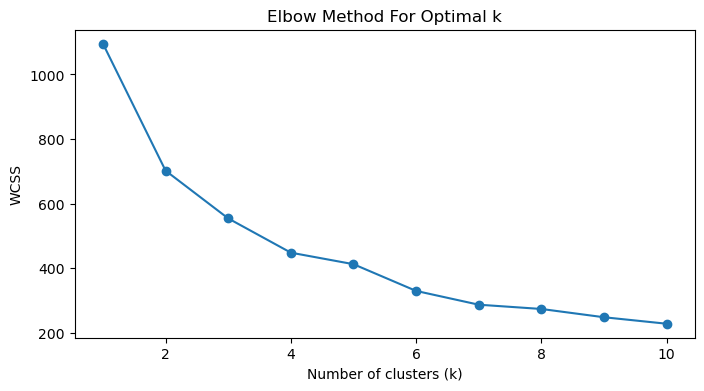

In [34]:
scaler = StandardScaler()

features = ['Demand_Score', 'Supply_Score', 'Quality_Score', 'Competition_Score', 'Operation_Score']

x_scaled = scaler.fit_transform(nyc_score[features].dropna())

wcss = []
K = range(1, 11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(x_scaled)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 4))
plt.plot(K, wcss, marker='o')
plt.xlabel("Number of clusters (k)")
plt.ylabel("WCSS")
plt.title("Elbow Method For Optimal k")
plt.show()



In [35]:
optimal_k = 4

kmeans = KMeans(n_clusters=optimal_k, random_state=42)
nyc_score['Cluster'] = kmeans.fit_predict(x_scaled)


for cluster_num in sorted(nyc_score['Cluster'].unique()):
    print(f"Cluster {cluster_num}:")
    print(nyc_score[nyc_score['Cluster'] == cluster_num]['ZIPCODE'].tolist())
    print("\n" + "-"*50 + "\n") 

print("Cluster Centroids (scaled):")
print(kmeans.cluster_centers_)


Cluster 0:
[10005, 10006, 10007, 10027, 10032, 10035, 10038, 10039, 10280, 10282, 10301, 10302, 10303, 10304, 10305, 10306, 10307, 10308, 10309, 10310, 10312, 10314, 10451, 10452, 10453, 10454, 10455, 10456, 10457, 10459, 10460, 10461, 10462, 10463, 10465, 10466, 10467, 10468, 10469, 10470, 10471, 10472, 10473, 10474, 10475, 11001, 11004, 11040, 11102, 11203, 11204, 11207, 11208, 11210, 11212, 11213, 11214, 11218, 11219, 11221, 11223, 11224, 11225, 11226, 11228, 11229, 11230, 11232, 11233, 11234, 11236, 11239, 11355, 11356, 11357, 11358, 11360, 11362, 11363, 11364, 11365, 11366, 11367, 11369, 11370, 11374, 11378, 11379, 11411, 11412, 11413, 11414, 11415, 11416, 11417, 11418, 11419, 11420, 11421, 11422, 11423, 11426, 11427, 11428, 11429, 11432, 11433, 11434, 11435, 11436, 11691, 11692, 11693, 11694, 11697]

--------------------------------------------------

Cluster 1:
[10020, 10037, 10044, 10069, 10103, 10111, 10112, 10115, 10119, 10153, 10165, 10167, 10168, 10169, 10171, 10172, 10173,

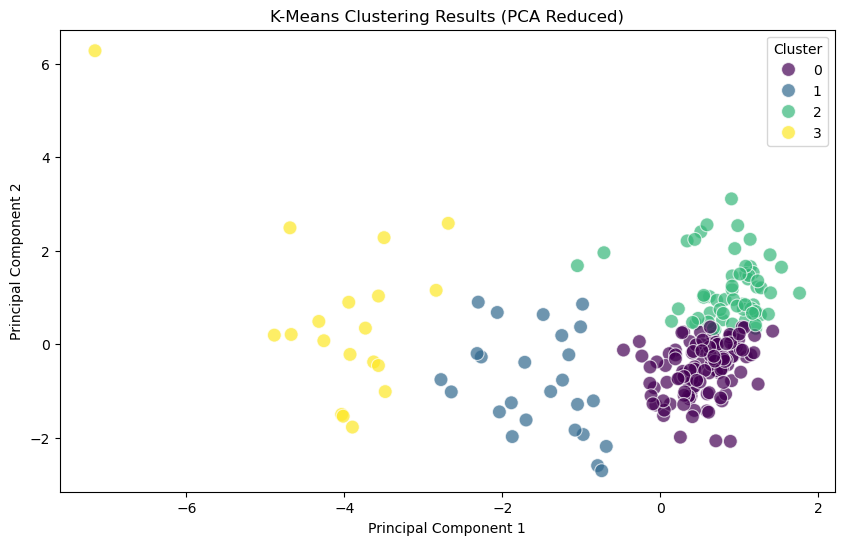

In [36]:
pca = PCA(n_components=2)
x_pca = pca.fit_transform(x_scaled)

nyc_score['PCA1'] = x_pca[:, 0]
nyc_score['PCA2'] = x_pca[:, 1]

plt.figure(figsize=(10, 6))
sns.scatterplot(x=nyc_score['PCA1'], y=nyc_score['PCA2'], hue=nyc_score['Cluster'], palette='viridis', s=100, alpha=0.7)
plt.title("K-Means Clustering Results (PCA Reduced)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster")
plt.show()

In [37]:
def format_number(value):
    if value >= 1_000_000:
        formatted_value = f'{value / 1_000_000:.2f}M'
    elif value >= 1_000:
        formatted_value = f'{value / 1_000:.2f}K'
    else:
        formatted_value = str(value)
    return formatted_value

uber_eats_nyc_market_size = 69 * 1000000000 * 0.023 * 0.349

nyc_score['Normalized_Score'] = nyc_score['Market_Potential_Score'] / nyc_score['Market_Potential_Score'].sum()

nyc_score['Market_Potential_Value'] = nyc_score['Normalized_Score'] * uber_eats_nyc_market_size

nyc_score['Market_Potential_Value'] = [format_number(num) for num in nyc_score['Market_Potential_Value']]

print(nyc_score[['ZIPCODE','Market_Potential_Score','Market_Potential_Value']].sort_values(by='Market_Potential_Score', ascending=False))

     ZIPCODE  Market_Potential_Score Market_Potential_Value
3      10003                0.553235                  3.79M
140    11215                0.549667                  3.76M
127    11201                0.532583                  3.64M
136    11211                0.529364                  3.62M
13     10014                0.523606                  3.58M
..       ...                     ...                    ...
49     10107                0.106151                726.44K
73     10179                0.095096                650.79K
42     10055                0.065631                449.14K
61     10155                0.064718                442.90K
0      10000                0.059142                404.74K

[219 rows x 3 columns]


In [38]:
gdf = gpd.read_file(zcta)
gdf.info()
gdf.head()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 33791 entries, 0 to 33790
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   ZCTA5CE20   33791 non-null  object  
 1   GEOID20     33791 non-null  object  
 2   CLASSFP20   33791 non-null  object  
 3   MTFCC20     33791 non-null  object  
 4   FUNCSTAT20  33791 non-null  object  
 5   ALAND20     33791 non-null  int64   
 6   AWATER20    33791 non-null  int64   
 7   INTPTLAT20  33791 non-null  object  
 8   INTPTLON20  33791 non-null  object  
 9   geometry    33791 non-null  geometry
dtypes: geometry(1), int64(2), object(7)
memory usage: 2.6+ MB


,ZCTA5CE20,GEOID20,CLASSFP20,MTFCC20,FUNCSTAT20,ALAND20,AWATER20,INTPTLAT20,INTPTLON20,geometry
0,35592,35592,B5,G6350,S,298552385,235989,+33.7427261,-088.0973903,"POLYGON ((-88.24735 33.6539, -88.24713 33.6541..."
1,35616,35616,B5,G6350,S,559506992,41870756,+34.7395036,-088.0193814,"POLYGON ((-88.13997 34.58184, -88.13995 34.582..."
2,35621,35621,B5,G6350,S,117838488,409438,+34.3350314,-086.7270557,"POLYGON ((-86.81659 34.3496, -86.81648 34.3496..."
3,35651,35651,B5,G6350,S,104521045,574316,+34.4609087,-087.4801507,"POLYGON ((-87.53087 34.42492, -87.53082 34.429..."
4,36010,36010,B5,G6350,S,335675180,236811,+31.6598950,-085.8128958,"POLYGON ((-85.95712 31.67744, -85.95676 31.677..."


In [39]:
gdf['ZIPCODE'] = gdf['ZCTA5CE20'].astype(int)

gdf = gdf.merge(nyc_score, on = 'ZIPCODE', how = 'right')

print(gdf)

    ZCTA5CE20 GEOID20 CLASSFP20 MTFCC20 FUNCSTAT20    ALAND20  AWATER20   INTPTLAT20    INTPTLON20  \
0         NaN     NaN       NaN     NaN        NaN        NaN       NaN          NaN           NaN   
1       10001   10001        B5   G6350          S  1615692.0       0.0  +40.7506496  -073.9972929   
2       10002   10002        B5   G6350          S  2129728.0       0.0  +40.7159693  -073.9868946   
3       10003   10003        B5   G6350          S  1480445.0       0.0  +40.7318636  -073.9891252   
4       10004   10004        B5   G6350          S  1179938.0       0.0  +40.6898053  -074.0173890   
..        ...     ...       ...     ...        ...        ...       ...          ...           ...   
214     11691   11691        B5   G6350          S  6949954.0  254400.0  +40.6020960  -073.7617938   
215     11692   11692        B5   G6350          S  2631023.0  255912.0  +40.5941540  -073.7919860   
216     11693   11693        B5   G6350          S  2560690.0    3120.0  +40.59166

In [40]:
print(gdf[gdf['ZCTA5CE20'].isna()]['Cluster'].value_counts())

Cluster
3    18
Name: count, dtype: int64


In [151]:
gdf_json = gdf.to_json()

m = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

folium.Choropleth(
    geo_data=gdf_json,
    name="Population",
    data=gdf,
    columns=["ZIPCODE", "Population"],
    key_on="feature.properties.ZIPCODE",
    fill_color="Blues",
    fill_opacity=0.7,
    line_opacity=0.2,
    nan_fill_color='white',
    nan_fill_opacity=1.0,
    legend_name="Population",
).add_to(m)

folium.Choropleth(
    geo_data=gdf_json,
    name="Restaurant Count",
    data=gdf,
    columns=["ZIPCODE", "Restaurant_Count"],
    key_on="feature.properties.ZIPCODE",
    fill_color="Reds",
    fill_opacity=0.7,
    line_opacity=0.2,
    nan_fill_color='white',
    nan_fill_opacity=1.0,
    legend_name="Restaurant Count",
).add_to(m)

folium.Choropleth(
    geo_data=gdf_json,
    name="Restaurant Quality Index",
    data=gdf,
    columns=["ZIPCODE", "Quality_Score"],
    key_on="feature.properties.ZIPCODE",
    fill_color="Oranges",
    fill_opacity=0.7,
    line_opacity=0.2,
    nan_fill_color='white',
    nan_fill_opacity=1.0,
    legend_name="Restaurant Quality Index",
).add_to(m)

folium.Choropleth(
    geo_data=gdf_json,
    name="Competition Proxy",
    data=gdf,
    columns=["ZIPCODE", "Competition_Density"],
    key_on="feature.properties.ZIPCODE",
    fill_color="Greens",
    fill_opacity=0.7,
    line_opacity=0.2,
    nan_fill_color='white',
    nan_fill_opacity=1.0,
    legend_name="Competition Proxy",
).add_to(m)

folium.Choropleth(
    geo_data=gdf_json,
    name="Delivery Bottleneck Score",
    data=gdf,
    columns=["ZIPCODE", "Delivery_Bottleneck_Score"],
    key_on="feature.properties.ZIPCODE",
    fill_color="Purples",
    fill_opacity=0.7,
    line_opacity=0.2,
    nan_fill_color='white',
    nan_fill_opacity=1.0,
    legend_name="Delivery Bottleneck Score",
).add_to(m)


folium.LayerControl().add_to(m)


m

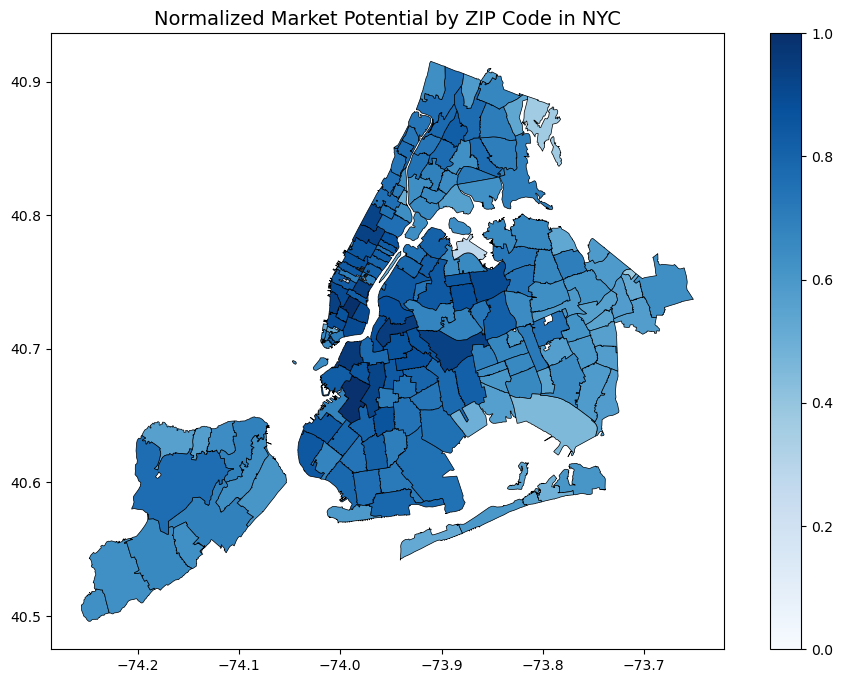

In [42]:
gdf['Normalized_Market_Potential_Score'] = (gdf['Market_Potential_Score'] - gdf['Market_Potential_Score'].min()
                                           ) / (gdf['Market_Potential_Score'].max() - gdf['Market_Potential_Score'].min())

fig, ax = plt.subplots(1, 1, figsize=(12, 8))

gdf.plot(column='Normalized_Market_Potential_Score',  
         cmap='Blues',
         linewidth=0.5,  
         edgecolor='black',  
         legend=True,  
         ax=ax)

ax.set_title("Normalized Market Potential by ZIP Code in NYC", fontsize=14)

plt.show()

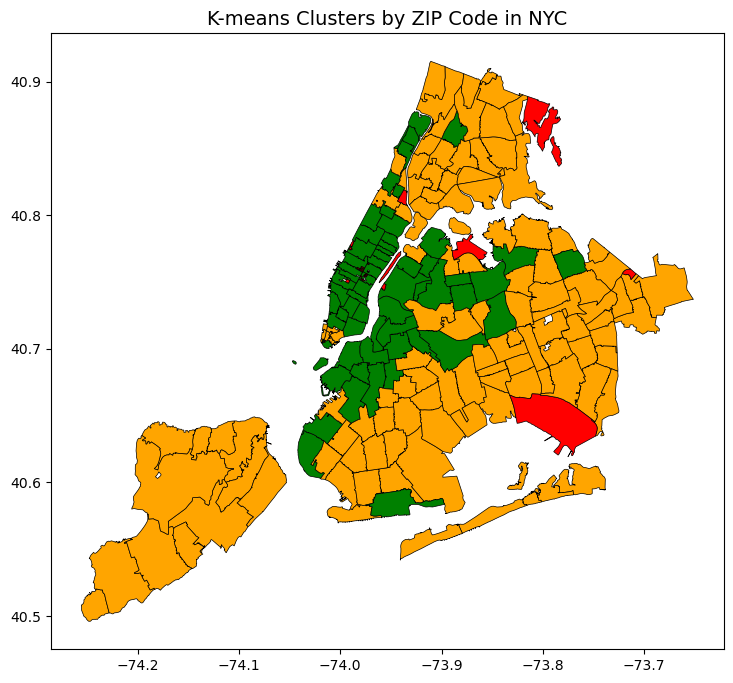

In [43]:
gdf_cluster = gdf[~gdf['ZCTA5CE20'].isna()]

cluster_colors = {0: 'orange', 1: 'red', 2: 'green', 3: 'black'}

gdf_cluster['Cluster_Color'] = gdf_cluster['Cluster'].map(cluster_colors)

fig, ax = plt.subplots(1, 1, figsize=(12, 8))

gdf_cluster.plot(color=gdf_cluster['Cluster_Color'],  
         linewidth=0.5,  
         edgecolor='black',  
         legend=True,  
         ax=ax)

ax.set_title("K-means Clusters by ZIP Code in NYC", fontsize=14)

plt.show()

In [44]:
m2 = folium.Map(location=[40.7128, -74.0060], zoom_start=12)

for idx, row in gdf_cluster.iterrows():
    
    geometry = row['geometry']
    centroid = geometry.centroid
    zip_code = row['ZCTA5CE20']
    color = row['Cluster_Color'] 

    folium.GeoJson(
        geometry,
        style_function=lambda feature, color=color: {
            'fillColor': color,
            'color': 'black', 
            'weight': 1,
            'fillOpacity': 0.5
        },
        tooltip=folium.Tooltip(f"ZIP Code: {zip_code}")
    ).add_to(m2)

m2

In [129]:
m3 = folium.Map(location=[40.7128, -74.0060], zoom_start=12)

eligible_zipcodes = []
manual_override = [10280,10282,10005,10006,10007,10038,10453,10468]

for idx, row in gdf_cluster.iterrows():
    geometry = row['geometry']
    zip_code = row['ZCTA5CE20']
    cluster_color = row['Cluster_Color']

    if int(zip_code) in manual_override:
        cluster_color = 'yellow'
        eligible_zipcodes.append(zip_code)
        
    else:
        
        if cluster_color == 'orange': 
            green_neighbors = 0
            
            for _, green_row in gdf_cluster[gdf_cluster['Cluster_Color'] == 'green'].iterrows():
                if geometry.intersects(green_row['geometry']): 
                    green_neighbors += 1
    
            if green_neighbors >= 2:
                cluster_color = 'yellow'
                eligible_zipcodes.append(zip_code)

    folium.GeoJson(
        geometry,
        style_function=lambda feature, color=cluster_color: {
            'fillColor': color,
            'color': 'black', 
            'weight': 1,
            'fillOpacity': 0.5
        },
        tooltip=folium.Tooltip(f"ZIP Code: {zip_code}")
    ).add_to(m3)

legend_html = '''
     <div style="position: fixed; 
                 bottom: 30px; left: 30px; width: 250px; height: 170px; 
                 border:2px solid black; z-index:9999; font-size:14px;
                 background-color: white; padding: 10px;">
         <strong>Legend:</strong><br>
         <i style="background: orange; width: 18px; height: 18px; display: inline-block; margin-right: 10px;"></i> Opportunity<br>
         <i style="background: green; width: 18px; height: 18px; display: inline-block; margin-right: 10px;"></i> Established<br>
         <i style="background: red; width: 18px; height: 18px; display: inline-block; margin-right: 10px;"></i> Underperforming<br>
         <i style="background: black; width: 18px; height: 18px; display: inline-block; margin-right: 10px;"></i> Underdeveloped<br>
         <i style="background: yellow; width: 18px; height: 18px; display: inline-block; margin-right: 10px;"></i> Growth<br>
     </div>
'''

m3.get_root().html.add_child(folium.Element(legend_html))

print(eligible_zipcodes)
print(len(eligible_zipcodes))
m3


['10005', '10006', '10007', '10027', '10032', '10035', '10038', '10039', '10280', '10282', '10453', '10468', '11102', '11207', '11218', '11219', '11221', '11225', '11228', '11232', '11355', '11358', '11367', '11369', '11370', '11374', '11378', '11379', '11418']
29


In [131]:
key_metrics = [demand_info, supply_info, quality_info, competition_info, operation_info]

combined = {}

for info in key_metrics:
    combined.update(info)

print(nyc_score[nyc_score['ZIPCODE'].isin([int(x) for x in eligible_zipcodes])][['ZIPCODE']+list(combined.keys())])

     ZIPCODE  Population  Population_Density  Working_Age_Population_%  Yound_Working_Adults_Population_%  Median_Household_Income  \
5      10005      9238.0            1.791699                  0.811756                           0.496861                 211810.0   
6      10006      4475.0            1.941432                  0.743911                           0.424358                 209972.0   
7      10007      7802.0            2.357812                  0.678928                           0.323507                      NaN   
25     10027     65068.0            2.654861                  0.547566                           0.297781                  64220.0   
30     10032     55579.0            2.602135                  0.559132                           0.285126                  56588.0   
33     10035     39082.0            2.595776                  0.524692                           0.248273                  40556.0   
36     10038     23342.0            2.182719                  

In [141]:
nyc_analysis = nyc_score.copy()

count = 0

for score in features:
    nyc_analysis[score+'_City_Avg'] = nyc_analysis[score].mean()

for index, row in nyc_analysis[nyc_analysis['ZIPCODE'].isin([int(x) for x in eligible_zipcodes])].iterrows():

    recommendations = []

    if row['Demand_Score'] > row['Demand_Score_City_Avg']:
        recommendations.append('Above city average demand, maintain customer loyalty.')
    else:
        recommendations.append('Below city average demand, consider promotional campaigns or discount incentives.')
    
    if row['Supply_Score'] > row['Supply_Score_City_Avg']:
        recommendations.append('Above city average supply, expand deliver radius to underserved area.')
    else:
        recommendations.append('Below city average supply, increase partnership offering.')

    if row['Quality_Score'] > row['Quality_Score_City_Avg']:
        recommendations.append('Above city average quality, communicate customer benefit.')
    else:
        recommendations.append('Below city average quality, re-evaluate partnership for a better customer satisfaction.')

    if row['Competition_Score'] > row['Competition_Score_City_Avg']:
        recommendations.append('Above city average competition, differentiate product offerings.')
    else:
        recommendations.append('Below city average competition, penetrate aggressively for early market share.')
    
    if row['Operation_Score'] > row['Operation_Score_City_Avg']:
        recommendations.append('Above city average traffic congestion, optimize delivery routes.')
    else:
        recommendations.append('Below city average traffic congestion, experiment with multi-stop delivery.')

    count += 1
    
    print(f"{count}, Recommendations for ZIP Code {row['ZIPCODE']}:")
    for rec in recommendations:
        print(f"- {rec}")
    print("\n")

1, Recommendations for ZIP Code 10005:
- Above city average demand, maintain customer loyalty.
- Below city average supply, increase partnership offering.
- Above city average quality, communicate customer benefit.
- Above city average competition, differentiate product offerings.
- Above city average traffic congestion, optimize delivery routes.


2, Recommendations for ZIP Code 10006:
- Above city average demand, maintain customer loyalty.
- Below city average supply, increase partnership offering.
- Above city average quality, communicate customer benefit.
- Below city average competition, penetrate aggressively for early market share.
- Above city average traffic congestion, optimize delivery routes.


3, Recommendations for ZIP Code 10007:
- Below city average demand, consider promotional campaigns or discount incentives.
- Below city average supply, increase partnership offering.
- Below city average quality, re-evaluate partnership for a better customer satisfaction.
- Below cit

In [155]:
m.save('layered.html')
m2.save('clustered.html')
m3.save('focused.html')